In [1]:
import os
from pathlib import Path

In [18]:
import acne_configs
from acne_dataset import AcneDataset
from acne_utils import get_train_transform, get_test_transform, collate_fn
from torch.utils.data import DataLoader

import torch
import numpy as np

In [25]:
import matplotlib.pyplot as plt
import cv2

In [21]:
from copy import deepcopy

In [8]:
TEST_FOLDER = Path('./data/final/f_circle/ds/test/')

In [9]:
test_dataset = AcneDataset(TEST_FOLDER, get_test_transform())

In [10]:
test_data_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=4,
        collate_fn=collate_fn
    )

In [11]:
cpu = torch.device('cpu')
device = torch.device('cuda:0')
cpu, device

(device(type='cpu'), device(type='cuda', index=0))

### MODEL

In [12]:
model = torch.load('./models/fasterrcnn_resnet50_fpn_epoch699.pkl', map_location="cuda:0")

In [13]:
num_classes = 5

### EVALUATE

In [14]:
model.eval();

In [15]:
def get_prediction(pred_dict, threshold=0.3, topk=3):
    pred_class = pred_dict['labels'].detach().numpy()
    pred_boxes = pred_dict['boxes'].detach().numpy()
    pred_score = pred_dict['scores'].detach().numpy()
    pred_t = pred_score >= threshold
    pred_boxes = pred_boxes[pred_t]
    pred_class = pred_class[pred_t]
    pred_scores = pred_score[pred_t]
    return pred_scores, pred_boxes, pred_class

In [16]:
def plot_with_bbox(img, gt_boxes, gt_classes, pred_boxes, pred_class, plot_bbox=False, plot_class=True):
    linewidth = img.shape[0]//500
    if plot_bbox:
        img_copy1 = deepcopy(img)
        img_copy2 = deepcopy(img)
        fig, ax = plt.subplots(1, 1, figsize=(24, 14))
        for box, _class in zip(gt_boxes, gt_classes):
            cv2.rectangle(img_copy1, (box[0], box[1]), (box[2], box[3]), (0, 255, 255), linewidth)
        for box, _class in zip(pred_boxes, pred_class):
            cv2.rectangle(img_copy2, (box[0], box[1]), (box[2], box[3]), (255, 0, 255), linewidth)
        hstack_np = np.hstack((img, img_copy1, img_copy2))
        ax.imshow(hstack_np)
    if plot_class:
        img_copy1 = deepcopy(img)
        img_copy2 = deepcopy(img)
        fig, ax = plt.subplots(1, 1, figsize=(24, 14))
        for box, _class in zip(pred_boxes, pred_class):
            cv2.rectangle(img_copy2, (box[0], box[1]), (box[2], box[3]), acne_configs.ID_COLOR_FLOAT[_class], linewidth)
        for box, _class in zip(gt_boxes, gt_classes):
            # if _class != 0 or EXCLUDED_BLUE is False:
            cv2.rectangle(img_copy1, (box[0], box[1]), (box[2], box[3]), acne_configs.ID_COLOR_FLOAT[_class], linewidth)
        hstack_np = np.hstack((img, img_copy1, img_copy2))
        ax.imshow(hstack_np)
    plt.show()

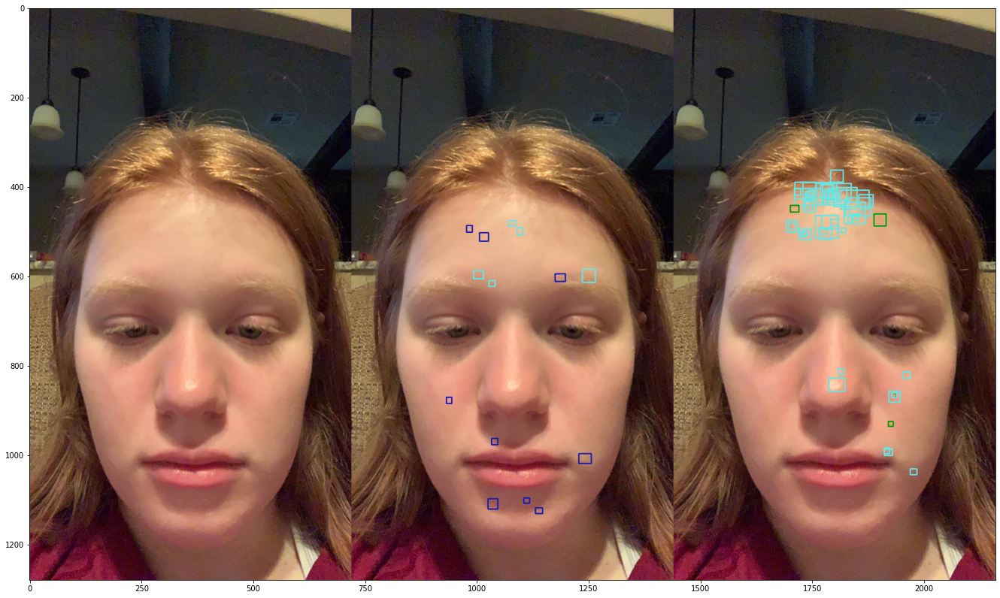

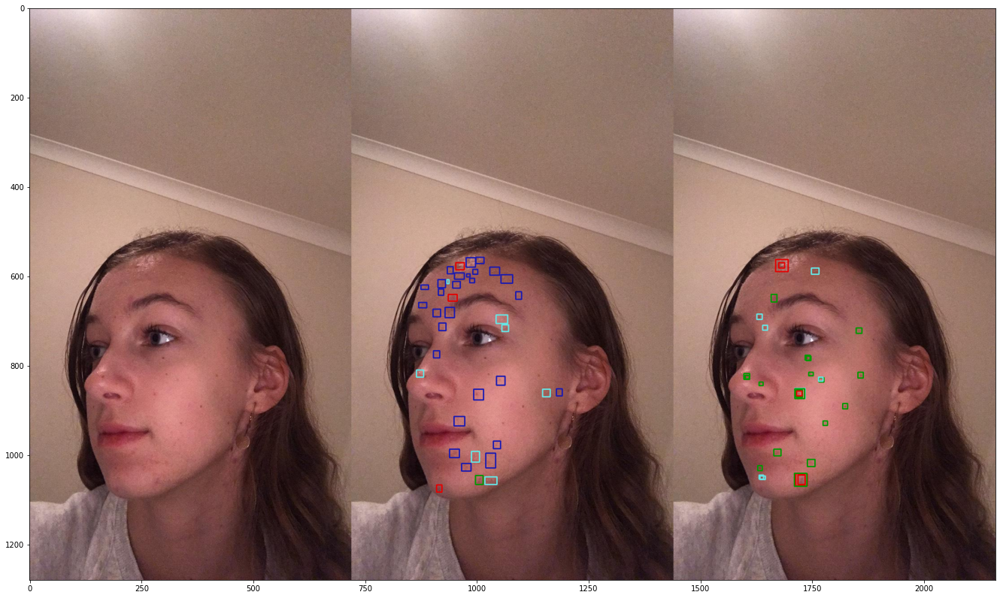

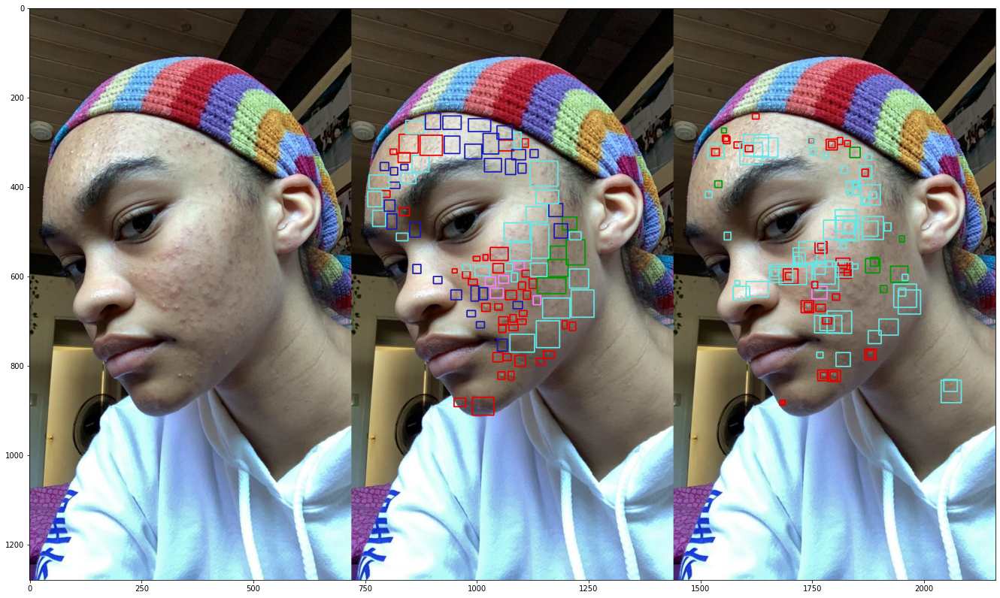

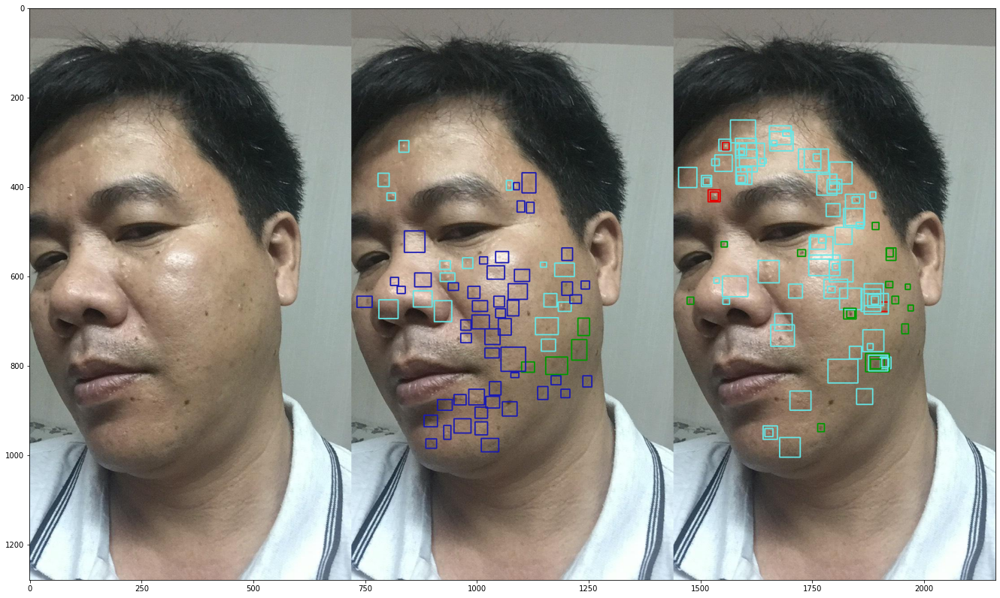

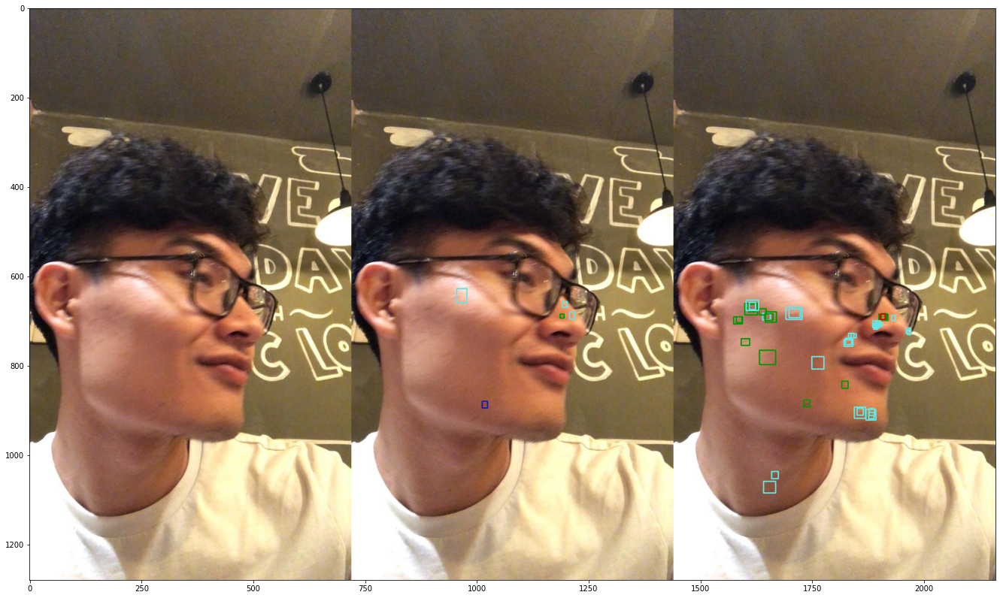

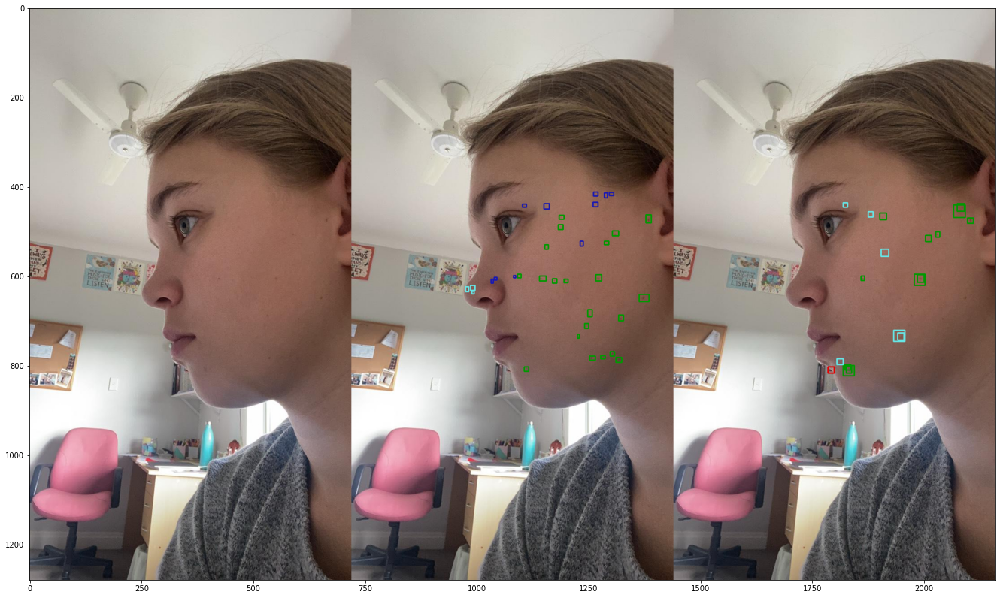

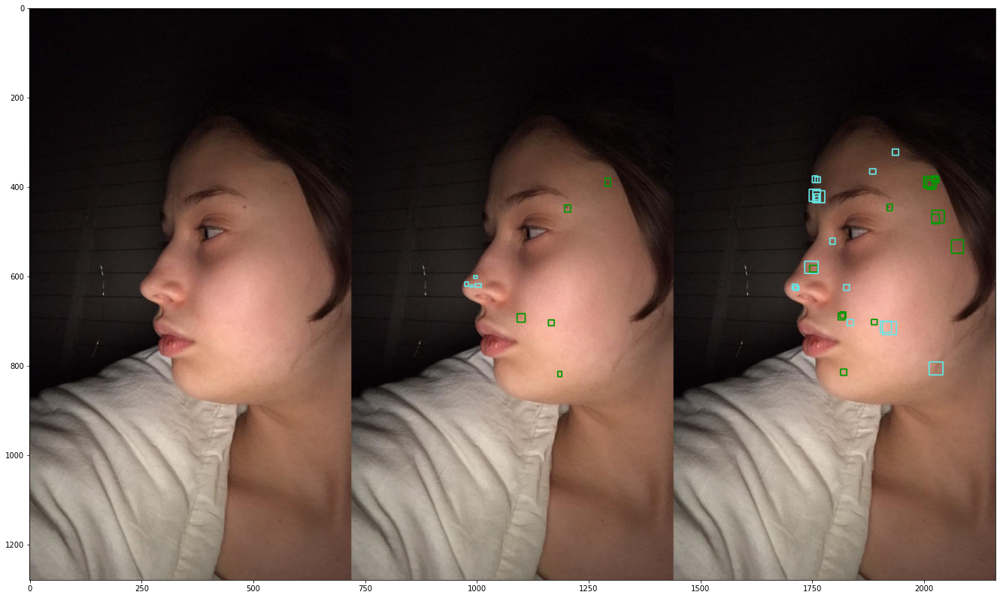

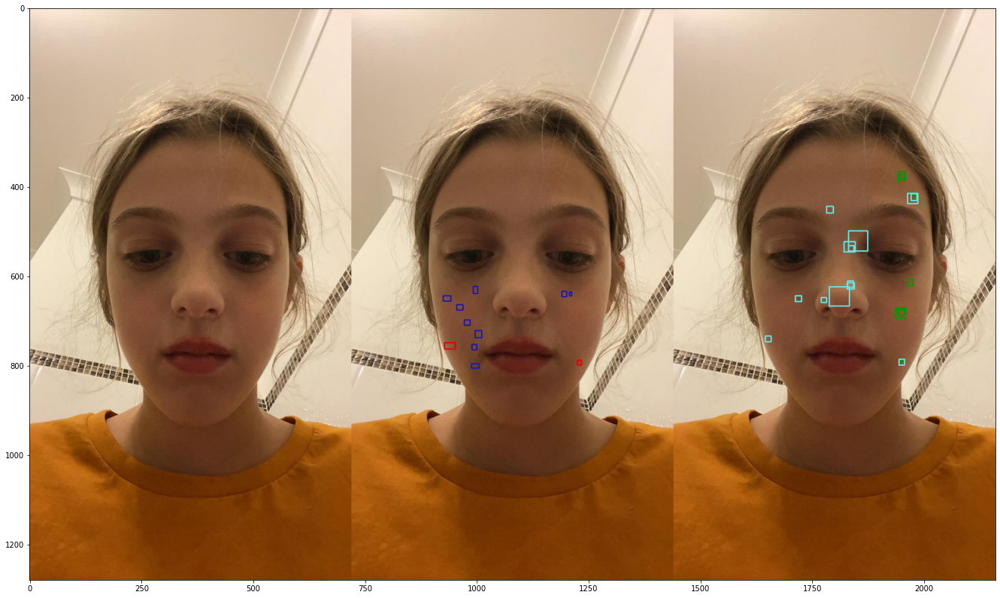

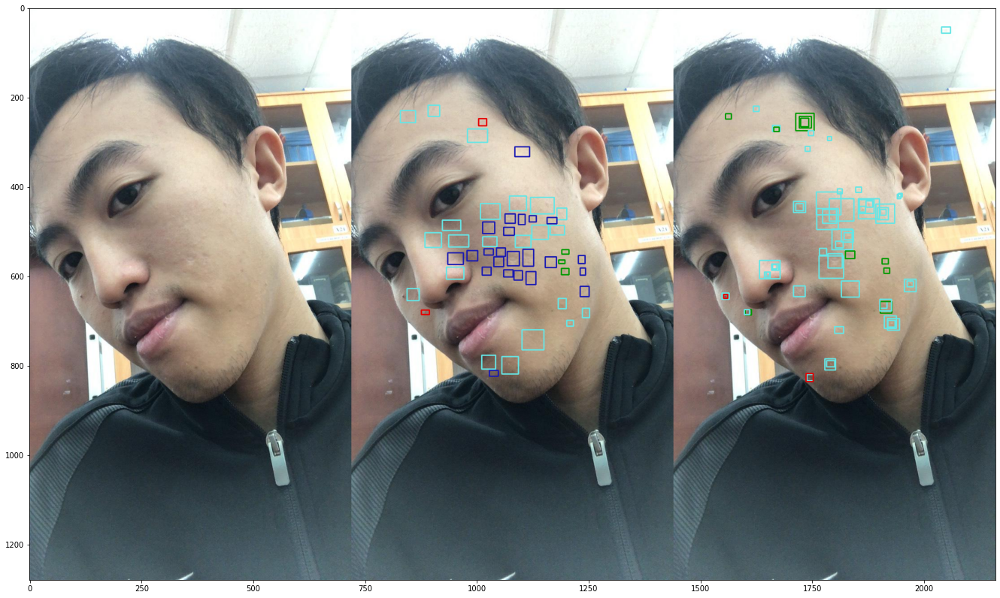

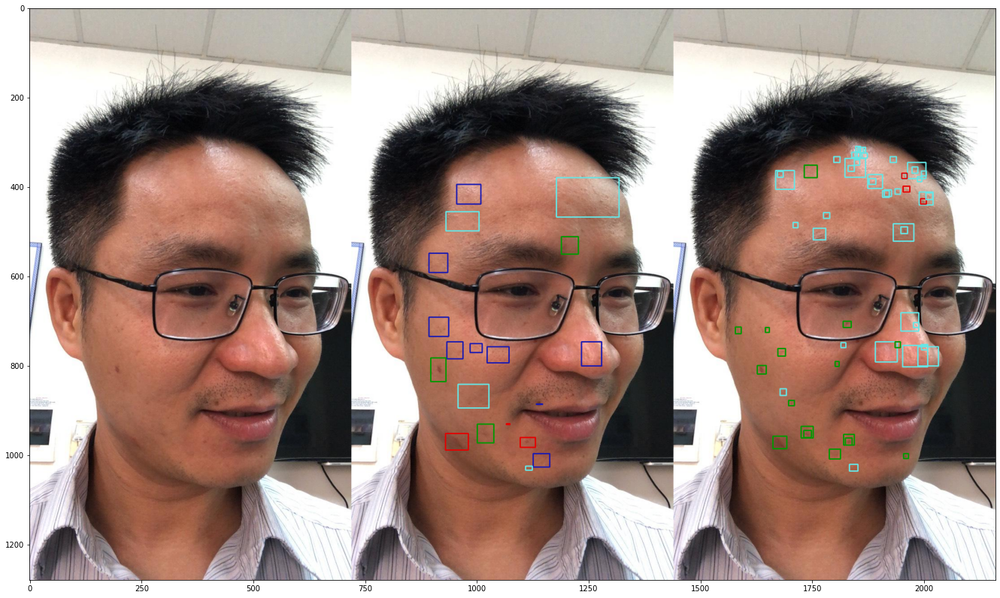

In [26]:
idx = 0
count = 0
stop_count = 3
for images, targets in iter(test_data_loader):
    if count >= 10:
        break
    count += 1
    images = list(img.to(device) for img in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    gt_classes = targets[0]['labels'].cpu().numpy().astype(np.int32)
    preds = model(images)
    preds = [{k: v.to(cpu) for k, v in t.items()} for t in preds]
    ## Groundtruth
    boxes = targets[idx]['boxes'].cpu().numpy().astype(np.int32)
    sample = images[idx].cpu().numpy()
    sample = sample.transpose(1,2,0)
    # Pred
    pred_scores, pred_boxes, pred_class = get_prediction(preds[idx], threshold=0.2)
    pred_boxes = pred_boxes.astype(np.int32)
    plot_with_bbox(sample, boxes, gt_classes, pred_boxes, pred_class)